In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style="whitegrid")

In [2]:
import plotly.express as px

This is a data exploration of a collection of wine reviews from Wine Ethusiast magazine. The file contains approximately 130,000 reviews of wines from all over the world.

In [3]:
df = pd.read_csv("winemag-data.csv", header=0)
df.head()
df.info() #lists all of the categories
df["taster_name"].unique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
Unnamed: 0               129971 non-null int64
country                  129908 non-null object
description              129971 non-null object
designation              92506 non-null object
points                   129971 non-null int64
price                    120975 non-null float64
province                 129908 non-null object
region_1                 108724 non-null object
region_2                 50511 non-null object
taster_name              103727 non-null object
taster_twitter_handle    98758 non-null object
title                    129971 non-null object
variety                  129970 non-null object
winery                   129971 non-null object
dtypes: float64(1), int64(2), object(11)
memory usage: 13.9+ MB


array(['Kerin O’Keefe', 'Roger Voss', 'Paul Gregutt',
       'Alexander Peartree', 'Michael Schachner', 'Anna Lee C. Iijima',
       'Virginie Boone', 'Matt Kettmann', nan, 'Sean P. Sullivan',
       'Jim Gordon', 'Joe Czerwinski', 'Anne Krebiehl\xa0MW',
       'Lauren Buzzeo', 'Mike DeSimone', 'Jeff Jenssen',
       'Susan Kostrzewa', 'Carrie Dykes', 'Fiona Adams',
       'Christina Pickard'], dtype=object)

In [4]:
#clean up data
df=df.drop('Unnamed: 0', axis=1)
tasty = df[df['taster_name'].notna()].copy() # remove null tasters. explicitly use ".copy" to let pandas know that we know that we want to alter the copy and not just view it.
# clean up one taster name - replace "non-breaking space" with a normal space
tasty['taster_name'] = tasty['taster_name'].str.replace('\xa0', ' ')

In [5]:
#create a new category that sums up quality based on point range
bins = [80, 85, 90, 95, 100]
group_names = ['okay', 'good', 'excellent', 'superlative']
df['Quality Category'] = pd.cut(df['points'], bins, labels=group_names, right=False)

We can find the countries with the most 'superlative' ratings

In [6]:
super_country = df[df['Quality Category'] == 'superlative']
super_list = super_country.groupby('country').count()['Quality Category']
country_list = df.groupby('country').count()['Quality Category']
super_pct = super_list / country_list
super_pct = super_pct.dropna()
super_pct

country
Argentina       0.002895
Australia       0.019759
Austria         0.034978
Chile           0.000447
England         0.040541
France          0.029749
Germany         0.030023
Hungary         0.034247
Italy           0.017506
New Zealand     0.001409
Portugal        0.018281
South Africa    0.002141
Spain           0.007675
US              0.018147
Name: Quality Category, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 <a list of 14 Text xticklabel objects>)

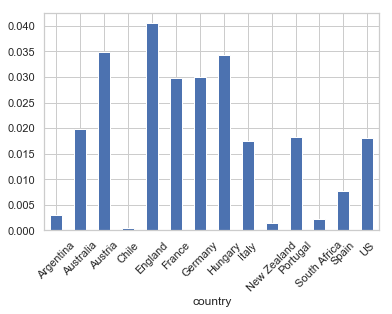

In [7]:
super_pct.plot(kind = 'bar')
plt.xticks(rotation = 45)

These are proportions (for scale), and we can see that England has the highest percentage of superlative ratings. However, England makes very little wine so of the major wine producing countries, Austria is best followed by France.

## A Comparison of Major Wine Producing Countries

In [8]:
US_comp = [ 'US','France', 'Italy', 'Spain', 'Australia', 'South Africa', 'Argentina', 'Chile']
df_UScomp = df[df.country.isin(US_comp)] #These countries produce most of the world's wine

A small note: we have exclude Germany and Austria from this list even though they produce a lot of wine because the wine they make isn't widely produced in the rest of the world. For example, Germany's output is mostly Riesling. We are comparing countries that make a diverse and similar style of wine

In [9]:
#a boxplot to compare point ratings
px.box(df_UScomp, x="country", y="points", hover_name="winery", title="Points Statistics for Top Wine Producing Countries")

France and Australia seem to be the best rated countries, although Wine Enthusiast, being an American magazine, rates more American wines even if they are of lesser quality. You can hover your mouse over each part of the graph to see the exact statistics, and if you hover over the outliers you can see what those wines are

It would also help to see how many reviews there are for each country

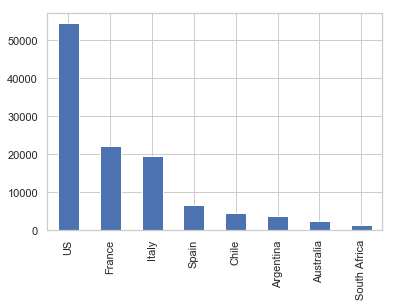

In [10]:
counts = df_UScomp['country'].value_counts()
counts.plot(kind='bar')

We want to keep in mind that there are a lot more US reviews than other countries

In [11]:
#group by country and points to see what information we can get
big8 = df_UScomp.groupby('country')[['points']]


The boxplot above already tells us all of our stats, but what if we want to return certain wineries based on different criteria?

In [12]:
#finds the highest rated wines in each country along with its price
highest_rated = big8.idxmax()
for country in US_comp:
    print(country, ":", df[['winery', 'points', 'price']].iloc[highest_rated.loc[country]])

US :           winery  points  price
45798  Cardinale     100  200.0
France :       winery  points  price
36528   Krug     100  259.0
Italy :           winery  points  price
7335  Avignonesi     100  210.0
Spain :             winery  points  price
40307  Emilio Moro      98  450.0
Australia :                           winery  points  price
345  Chambers Rosewood Vineyards     100  350.0
South Africa :         winery  points  price
9912  De Toren      95  330.0
Argentina :                      winery  points  price
82754  Bodega Catena Zapata      97  120.0
Chile :            winery  points  price
73993  Lapostolle      95   90.0


It looks like the reviewers prefer American, French, Italian, and Australian wines. Spain, despite producing far more wine than Australia, isn't doing as well. Even a $450 wines can't seem to get 100 points.

What if we want to compare 'Old World' versus 'New World' wines?

In [13]:
df_UScomp = df_UScomp.set_index("country")
mapping = {'US':"New World", "France":"Old World", "Italy":"Old World", "Spain":"Old World", "Australia":"New World",\
          "South Africa":"New World", "Argentina":"New World", "Chile":"New World"}
new_old = df_UScomp.groupby(mapping).describe()
new_old

points                                                      \
             count       mean       std   min   25%   50%   75%    max   
New World  66506.0  88.308514  3.143081  80.0  86.0  88.0  91.0  100.0   
Old World  48278.0  88.516343  2.938511  80.0  87.0  88.0  90.0  100.0   

             price                                                       
             count       mean        std  min   25%   50%   75%     max  
New World  66024.0  34.558691  27.983821  4.0  18.0  28.0  44.0  2013.0  
Old World  41263.0  38.475656  56.121166  4.0  16.0  25.0  45.0  3300.0

It looks like the stats are very close. Old World wines are more expensive on average but have higher variance on price. 

Finally, let's look a scatter plot of points versus price

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


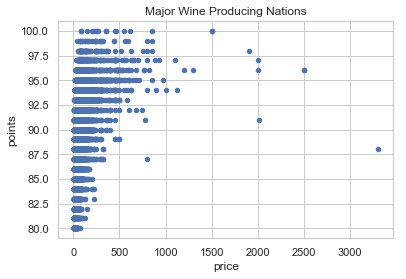

In [14]:
df_UScomp.plot(x="price", y="points", kind="scatter", title="Major Wine Producing Nations")


We can find what those price outliers are

In [15]:
#Find the outlier
df[df['price'] > 1500][['country','points', 'price', 'province', 'title']]



,country,points,price,province,title
1558,France,98,1900.0,Bordeaux,Château Margaux 2009 Margaux
15840,France,96,2500.0,Bordeaux,Château Pétrus 2014 Pomerol
65352,France,97,2000.0,Bordeaux,Château Pétrus 2011 Pomerol
80290,France,88,3300.0,Bordeaux,Château les Ormes Sorbet 2013 Médoc
98380,France,96,2500.0,Burgundy,Domaine du Comte Liger-Belair 2010 La Romanée
113564,France,96,2000.0,Burgundy,Domaine du Comte Liger-Belair 2005 La Romanée
120391,US,91,2013.0,California,Blair 2013 Roger Rose Vineyard Chardonnay (Arr...


Bordeauxs are old-school rich people's wine so this isn't surprising. That California wine is awfully expensive for only 91 points. That big outlier is a $3300 Bordeaux that isn't even 90 points.

## A Closer Look at Virginia wines and Wineries Near UVa

In [16]:
df_VA = df[df['province'] == 'Virginia']
df_VA.groupby('region_1').describe() #a comparison of Virginia's wine regions

points                                               \
                          count       mean       std   min   25%   50%   75%   
region_1                                                                       
Middleburg                 29.0  85.724138  1.790781  81.0  85.0  86.0  87.0   
Monticello                155.0  86.354839  2.034578  81.0  85.0  87.0  88.0   
Shenandoah Valley          32.0  85.218750  1.736410  81.0  84.0  86.0  86.0   
Virginia                  556.0  85.424460  2.106116  80.0  84.0  85.0  87.0   
Virginia's Eastern Shore    5.0  85.200000  1.095445  84.0  85.0  85.0  85.0   

                                price                                          \
                           max  count       mean        std   min   25%   50%   
region_1                                                                        
Middleburg                89.0   28.0  27.964286   5.371269  18.0  24.0  28.0   
Monticello                92.0  153.0  25.790850   8.538345  14.0  20.0  24.0   
Shenandoah Valley         89.0   32.0  22.750000   6.681703  14.0  19.0  20.5   
Virginia                  92.0  552.0  27.625000  10.861392  10.0  20.0  25.0   
Virginia's Eastern Shore  87.0    5.0  18.800000   1.303840  17.0  18.0  19.0   

                                       
                           75%    max  
region_1                               
Middleburg                30.0   40.0  
Monticello                30.0   58.0  
Shenandoah Valley         24.0   40.0  
Virginia                  32.0  100.0  
Virginia's Eastern Shore  20.0   20.0

The statistics are close, but it looks like most Virginia wines don't fall into any special sub-regions. No Virginia wine is rated above a 92 which seems harsh.

Let's say you were interested in wineries near the DSI, because even research data scientists need to have fun on weekends. This would be the Monticello sub-region.

In [17]:
df_Monticello = df[df['region_1'] == "Monticello"]
df_Monticello.dropna(subset=['price'], inplace=True)#get rid of a few rows with missing prices

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



we can find out what the highest rated wines are:

In [23]:
df_Monticello[df_Monticello['Quality Category'] == 'excellent'].set_index('winery')

,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,Quality Category
winery,,,,,,,,,,,,,
Lovingston,US,This is a well-done effort from winemaker Riaa...,Josie's Knoll,91,20.0,Virginia,Monticello,NaN,Alexander Peartree,NaN,Lovingston 2012 Josie's Knoll Merlot (Monticello),Merlot,excellent
King Family,US,"This blend of Merlot, Cabernet Franc, Petit Ve...",NaN,90,31.0,Virginia,Monticello,NaN,Alexander Peartree,NaN,King Family 2012 Meritage (Monticello),Meritage,excellent
Lovingston,US,"This blend of Merlot, Cabernet Franc and Pinot...",Josie's Knoll Rotunda,90,20.0,Virginia,Monticello,NaN,Carrie Dykes,NaN,Lovingston 2015 Josie's Knoll Rotunda Red (Mon...,Red Blend,excellent
Trump,US,"Rich and luscious scents of baked apple, dried...",Brut SP Reserve,91,45.0,Virginia,Monticello,NaN,NaN,NaN,Trump 2007 Brut SP Reserve Sparkling (Monticello),Sparkling Blend,excellent
Lovingston,US,"Dark and sexy aromas of spiced blackberry, boy...",Estate Reserve Josie's Knoll,91,40.0,Virginia,Monticello,NaN,NaN,NaN,Lovingston 2010 Estate Reserve Josie's Knoll R...,Red Blend,excellent
Trump,US,Exuberant green apple and quince aromas meet a...,SP Reserve Brut,90,45.0,Virginia,Monticello,NaN,Alexander Peartree,NaN,Trump 2008 SP Reserve Brut Sparkling (Monticello),Sparkling Blend,excellent
King Family,US,Winemaker Matthieu Finot deftly transforms thi...,Orange,92,35.0,Virginia,Monticello,NaN,Carrie Dykes,NaN,King Family 2015 Orange Viognier (Monticello),Viognier,excellent


Looks like the there are a couple of Trump wines on there. Yes, the President of the United States owns a winery near UVa for some reason. Let's see how his wines compare to other wines in the same area.

Text(0.5, 1.0, 'Charlottesville-Area Wineries, Trump Wines in Orange')

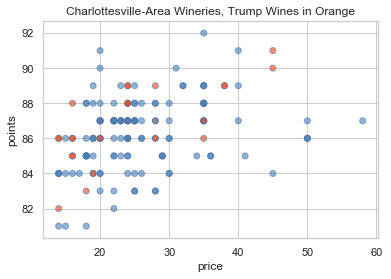

In [24]:
Trump_colors = ['orangered' if winery == 'Trump' else 'steelblue' for winery in df_Monticello.winery]
m = sns.regplot(x = 'price', y = 'points', data = df_Monticello, fit_reg=False, scatter_kws={'facecolors':Trump_colors, 'alpha':0.6})
plt.title("Charlottesville-Area Wineries, Trump Wines in Orange")

The Trump wines appear in (what else?) orange. Looks like his wines are fairly competitive on points and price.

We can also look at a detailed version of the same scatter plot to get info on all wines in this area:

In [25]:
df_Monticello["normalized points"] = (df_Monticello['points'] - df_Monticello['points'].min())/(df_Monticello['points'].max() - df_Monticello['points'].min())
#This standardizes the points so we can use them to size the graph for easier reading
px.scatter(df_Monticello, x="price", y="points", color="winery", size='normalized points', hover_name="variety")

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



You can now hover over any wine to find the winery, wine type, price, and points. It looks like Lovingston wines are good value with high points.

## User Interaction

We can arrange the dataframe in different ways to allow a user to input information and receive back answers.

In [7]:
df2 = df.set_index(['variety', 'country']).sort_index() #index to easily look up by country and variety
df2.head()

description  \
variety     country                                                      
Abouriou    France   Abouriou is a grape found almost exclusively i...   
            France   Despite its proximity to Bordeaux, the Marmand...   
            US       Comprised 100% of this rare variety, this wine...   
Agiorgitiko Greece   Thyme and crushed herbs on the nose of this re...   
            Greece   This wine has the plucky character typical of ...   

                          designation  points  price          province  \
variety     country                                                      
Abouriou    France               Just      87   15.0  Southwest France   
            France                NaN      91   15.0  Southwest France   
            US       Moonlight Sonata      85   75.0        California   
Agiorgitiko Greece                NaN      90   15.0             Nemea   
            Greece                NaN      85   18.0             Nemea   

                                 region_1 region_2      taster_name  \
variety     country                                                   
Abouriou    France    Côtes du Marmandais      NaN       Roger Voss   
            France    Côtes du Marmandais      NaN       Roger Voss   
            US       Russian River Valley   Sonoma   Virginie Boone   
Agiorgitiko Greece                    NaN      NaN  Susan Kostrzewa   
            Greece                    NaN      NaN  Susan Kostrzewa   

                    taster_twitter_handle  \
variety     country                         
Abouriou    France             @vossroger   
            France             @vossroger   
            US                    @vboone   
Agiorgitiko Greece          @suskostrzewa   
            Greece          @suskostrzewa   

                                                                 title  \
variety     country                                                      
Abouriou    France   Cave du Marmandais 2012 Just Abouriou (Côtes d...   
            France   Lionel Osmin & Cie 2014 Abouriou (Côtes du Mar...   
            US       Cerridwen 2012 Moonlight Sonata Abouriou (Russ...   
Agiorgitiko Greece                   Kintonis 2012 Agiorgitiko (Nemea)   
            Greece    Estate Constantin Gofas 2008 Agiorgitiko (Nemea)   

                                      winery Quality Category  
variety     country                                            
Abouriou    France        Cave du Marmandais             good  
            France        Lionel Osmin & Cie        excellent  
            US                     Cerridwen             good  
Agiorgitiko Greece                  Kintonis        excellent  
            Greece   Estate Constantin Gofas             good

In [8]:
def wine_function(dataframe): #function to allow user to look up all wines 90 and above by country and variety
    try:
        variety = input("Enter a grape variety (capitalize first letter):")
        country = input("Enter a country:")

        return dataframe[dataframe['points'] >= 90].loc[(variety, country)]
    except KeyError:
        print("Incorrect entry, remember to capitalize first letter (e.g. Cabernet Sauvignon)")

In [9]:
wine_function(df2) 

Enter a grape variety (capitalize first letter):Chardonnay
Enter a country:Spain


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: PerformanceWarning:

indexing past lexsort depth may impact performance.



description  \
variety    country                                                      
Chardonnay Spain    Bold and gold, with penetrating aromas of oran...   
           Spain    Slightly briny pear and apple aromas lead to a...   
           Spain    The to-the-point bouquet includes lightly toas...   

                                         designation  points  price  \
variety    country                                                    
Chardonnay Spain    Caligo Essència Sweet White Wine      91   90.0   
           Spain          Privat Reserva Brut Nature      90   26.0   
           Spain                              Privat      91   27.0   

                       province region_1 region_2        taster_name  \
variety    country                                                     
Chardonnay Spain    Spain Other    Spain      NaN  Michael Schachner   
           Spain      Catalonia     Cava      NaN  Michael Schachner   
           Spain      Catalonia     Cava      NaN  Michael Schachner   

                   taster_twitter_handle  \
variety    country                         
Chardonnay Spain             @wineschach   
           Spain             @wineschach   
           Spain             @wineschach   

                                                                title  \
variety    country                                                      
Chardonnay Spain    D.G. Viticultors NV Caligo Essència Sweet Whit...   
           Spain    Alta Alella 2014 Privat Reserva Brut Nature Ch...   
           Spain            Alta Alella 2012 Privat Chardonnay (Cava)   

                              winery Quality Category  
variety    country                                     
Chardonnay Spain    D.G. Viticultors        excellent  
           Spain         Alta Alella        excellent  
           Spain         Alta Alella        excellent

The following function allows a user to input their price range, a grape variety, and a region and returns 
a scatterplot listing the wines that satisfy their criteria, which the user can hover over to find winery's name

In [10]:
def wine_function2(dataframe):
    price_min = int(input("Enter your minimum price (0 if none). Do not include dollar sign:"))
    price_max = int(input("Enter your maximum price:"))
    variety = input("Enter a grape variety (capitalize first letter), or \'none\' if none:")
    if variety == "none":
        variety = list(df['variety'])#this makes it so that if you put 'none' it will draw from all varieties
    region = input("Enter a wine region (e.g. Napa)")
    data1 = dataframe.query('(price >= @price_min & price <= @price_max) & (region_1 == @region | region_2 == @region) & \
    variety == @variety')
   
    return px.scatter(data1, x='price', y='points', color='winery', hover_name='variety')
    
    

In [10]:
wine_function2(df)

Enter your minimum price (0 if none). Do not include dollar sign:0
Enter your maximum price:25
Enter a grape variety (capitalize first letter), or 'none' if none:none
Enter a wine region (e.g. Napa)Bordeaux


# Looking at the Tasters

## Add Analytical Columns to Data

In [11]:
# add a num_reviews column to show the number of reviews from that taster
tasty['num_reviews'] = tasty.groupby('taster_name', as_index=False)['description'].transform('count')

In [12]:
# Calculate each taster's most-reviewed country and add it to the df
tc = tasty.groupby(['taster_name','country'],as_index=False).count().sort_values('num_reviews').groupby('taster_name').tail(1)[['taster_name','country']].copy()
tc.columns=['taster_name','top_country']
tasty = pd.merge(tasty,tc,how='left',on='taster_name')

In [13]:

# oh, there's a difference between "top" country and "favorite" country. top=max count, favorite is max avg score
tfc = tasty.groupby(['taster_name','country'],as_index=False).agg({'num_reviews':'count','points':'mean'}).sort_values('points').groupby('taster_name').tail(1)[['taster_name','country']].copy()
tfc.columns=['taster_name','fav_country']
tasty = pd.merge(tasty,tfc,how='left',on='taster_name')

## Create Functions to Process Data

In [14]:

def get_taster_list():
    # create a list of the unique taster names in the dataset and return them, with an index number
    tl = tasty.groupby('taster_name', as_index=False).mean().sort_values('num_reviews', ascending=False).reset_index()[['taster_name','num_reviews']]
    tl.columns = ["Taster Name", "Number of Reviews"]
    return tl

In [15]:
def choose_taster(taster_name = None):
    if taster_name == None:
        print("Choose a taster name (or number):")
        taster_list = get_taster_list()
        print(taster_list)
        q = input()
        try:
            idx = int(q)
            taster_name = taster_list.iloc[idx]['Taster Name']
        except ValueError: # input is not an int, assume it's a name
            taster_name = q
        except IndexError: # input is an int, but out of range
            print("That number isn't in the list, please try again.")
            taster_name = choose_taster()
    tdf = tasty[tasty['taster_name']==taster_name]
    if len(tdf.index) == 0:
        print("Taster name not found, please try again.")
        taster_name = choose_taster()
    return tdf

In [16]:
def taster_profile(taster_name = None):
    tdf = choose_taster(taster_name) # get a dataframe with just the selected taster's info
    print("-" * 75)
    print("Taster Profile")
    prof = tdf.groupby('taster_name', as_index=False).agg({'num_reviews':'max','top_country':'max','fav_country':'max','points':'mean'}).sort_values('num_reviews', ascending=False)
    print("Name: " + prof['taster_name'][0])
    print(str(prof['num_reviews'][0]) + " reviews\n")
    
    # Taster-Country stats
    print("Most-reviewed country: " + prof['top_country'][0])
    print("Favorite country: " + prof['fav_country'][0])
    sns.set_style("whitegrid")
    scp = sns.boxplot(x='points', y='country', data=tdf)
    scp.set(xlabel='Points', ylabel='Country')
    plt.suptitle('Taster point spread by country', fontsize=16)
    plt.show(scp)
    
    # Taster-Variety stats
    print("Top varieties for this taster:")
    top_var = tdf.groupby('variety',as_index=False).agg({'description':'count','points':['mean','std']}).sort_values(('description','count'), ascending=False).head(5)
    top_var.columns = ['Variety', '# Reviews', 'Average Score', 'Score Std. Dev.']
    print(top_var.to_string(index=False))

## Run the Function

---------------------------------------------------------------------------
Taster Profile
Name: Kerin O’Keefe
10776 reviews

Most-reviewed country: Italy
Favorite country: Italy


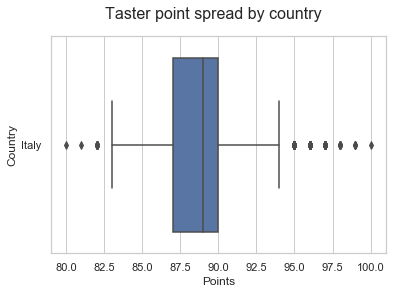

Top varieties for this taster:
     Variety  # Reviews  Average Score  Score Std. Dev.
   Red Blend       2507      88.681292         2.320865
    Nebbiolo       1930      90.160622         2.774412
  Sangiovese       1584      89.203914         2.603649
 White Blend        357      88.268908         2.041827
       Glera        351      88.216524         2.085011


In [17]:
taster_profile("Kerin O’Keefe") # or leave taster name blank for interactive choice
#taster_profile()

# Unit Tests

In [18]:
import unittest

In [19]:
class CheckingWine(unittest.TestCase):
   def test_wine_function(self):
       print("(TESTING) Please type 'Riesling' and 'France'")
       tdf = wine_function(df2)
       exp = df2[df2['points'] >= 90].loc[('Riesling', 'France')] # the expected result to compare to
       self.assertTrue(tdf.equals(exp), "wine_function() selected a different dataframe than expected")
   def test_wine_function2(self):
       print("(TESTING) Please enter '0', then '100', then 'Malbec', then 'Cafayate'")
       tdf = wine_function2(df)
       exp_q = df.query('(price >= 0 & price <= 100) & (region_1 == "Cafayate" | region_2 == "") & \
   variety == "Malbec"')
       exp = px.scatter(exp_q, x='price', y='points', color='winery', hover_name='variety')
       self.assertEqual(tdf, exp, "wine_function2() returned a different Figure object than expected")

In [20]:

class CheckingTasterBias(unittest.TestCase):
    def test_get_taster_list(self):
        try:
            tl = get_taster_list()
            self.assertNotEqual(len(tl.index), 0, "Taster list was not created") # df is not empty
        except Exception:
            self.fail("Unknown problem creating taster list")
    
    def test_choose_taster_no_arg(self):
        print("(TESTING) Please select 'Roger Voss' as the taster")
        tdf = choose_taster()
        compare_to = tasty[tasty['taster_name']=='Roger Voss']
        self.assertTrue(tdf.equals(compare_to), "choose_taster() selected a different dataframe than expected") 
        
    def test_choose_taster_with_arg(self):
        tdf = choose_taster('Virginie Boone')
        compare_to = tasty[tasty['taster_name']=='Virginie Boone']
        self.assertTrue(tdf.equals(compare_to), "choose_taster('Virginie Boone') selected a different dataframe than expected")

In [21]:
# Run unit tests
if __name__ == '__main__':
    unittest.main(argv=['first-arg-is-ignored'], exit=False)

(TESTING) Please select 'Roger Voss' as the taster
Choose a taster name (or number):
           Taster Name  Number of Reviews
0           Roger Voss            25514.0
1    Michael Schachner            15134.0
2        Kerin O’Keefe            10776.0
3       Virginie Boone             9537.0
4         Paul Gregutt             9532.0
5        Matt Kettmann             6332.0
6       Joe Czerwinski             5147.0
7     Sean P. Sullivan             4966.0
8   Anna Lee C. Iijima             4415.0
9           Jim Gordon             4177.0
10    Anne Krebiehl MW             3685.0
11       Lauren Buzzeo             1835.0
12     Susan Kostrzewa             1085.0
13       Mike DeSimone              514.0
14        Jeff Jenssen              491.0
15  Alexander Peartree              415.0
16        Carrie Dykes              139.0
17         Fiona Adams               27.0
18   Christina Pickard                6.0
Roger Voss


...

(TESTING) Please type 'Riesling' and 'France'
Enter a grape variety (capitalize first letter):Riesling
Enter a country:France


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: PerformanceWarning:

indexing past lexsort depth may impact performance.

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: PerformanceWarning:

indexing past lexsort depth may impact performance.

.

(TESTING) Please enter '0', then '100', then 'Malbec', then 'Cafayate'
Enter your minimum price (0 if none). Do not include dollar sign:0
Enter your maximum price:100
Enter a grape variety (capitalize first letter), or 'none' if none:Malbec
Enter a wine region (e.g. Napa)Cafayate


.
----------------------------------------------------------------------
Ran 5 tests in 21.127s

OK
